<a href="https://colab.research.google.com/github/nahinAbrar/Plant-Disease-Detection-from-Leaf-Images/blob/main/Leaf_Classsification_YOLOv5.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive

drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [ ]:
dir = '/content/gdrive/MyDrive/SoftComProject/Project'

In [ ]:
#clone YOLOv5 and
!git clone https://github.com/ultralytics/yolov5  # clone repo
%cd yolov5
%pip install -qr requirements.txt # install dependencies
%pip install -q roboflow

import torch
import os
from IPython.display import Image, clear_output  # to display images

print(f"Setup complete. Using torch {torch.__version__} ({torch.cuda.get_device_properties(0).name if torch.cuda.is_available() else 'CPU'})")

Cloning into 'yolov5'...
remote: Enumerating objects: 16388, done.
remote: Counting objects: 100% (282/282), done.
remote: Compressing objects: 100% (208/208), done.
remote: Total 16388 (delta 139), reused 158 (delta 74), pack-reused 16106
Receiving objects: 100% (16388/16388), 15.16 MiB | 15.13 MiB/s, done.
Resolving deltas: 100% (11176/11176), done.
/content/yolov5
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 196.4/196.4 kB 5.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.5/4.5 MB 88.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 705.0/705.0 kB 46.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 6.2 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
imageio 2.31.6 requires pillow<10.1.0,>=8.3.2, but you have pillow 10.2.0 which is incompatible.
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━

In [ ]:
os.environ["DATASET_DIRECTORY"] = "/content/datasets"

In [ ]:
!python train.py --img 416 --batch 16 --epochs 40 --data {dir}/data.yaml --weights yolov5l.pt --cache

2024-01-28 15:27:13.982995: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-01-28 15:27:13.983044: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-01-28 15:27:13.985029: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
train: weights=yolov5l.pt, cfg=, data=/content/gdrive/MyDrive/SoftComProject/Project/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=40, batch_size=16, imgsz=416, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, evolve_population=data/hyps, resume_evolve=None, bucket=, cache=ram, image_weights=False, devic

In [ ]:
!zip -r /content/gdrive/MyDrive/train_results.zip /content/yolov5/runs/train

  adding: content/yolov5/runs/train/ (stored 0%)
  adding: content/yolov5/runs/train/exp/ (stored 0%)
  adding: content/yolov5/runs/train/exp/labels_correlogram.jpg (deflated 36%)
  adding: content/yolov5/runs/train/exp/results.csv (deflated 82%)
  adding: content/yolov5/runs/train/exp/R_curve.png (deflated 10%)
  adding: content/yolov5/runs/train/exp/weights/ (stored 0%)
  adding: content/yolov5/runs/train/exp/weights/best.pt (deflated 8%)
  adding: content/yolov5/runs/train/exp/weights/last.pt (deflated 8%)
  adding: content/yolov5/runs/train/exp/results.png (deflated 8%)
  adding: content/yolov5/runs/train/exp/val_batch0_pred.jpg (deflated 13%)
  adding: content/yolov5/runs/train/exp/F1_curve.png (deflated 9%)
  adding: content/yolov5/runs/train/exp/val_batch1_labels.jpg (deflated 7%)
  adding: content/yolov5/runs/train/exp/train_batch0.jpg (deflated 4%)
  adding: content/yolov5/runs/train/exp/PR_curve.png (deflated 12%)
  adding: content/yolov5/runs/train/exp/opt.yaml (deflated 49%

In [ ]:
!python detect.py --weights runs/train/exp/weights/best.pt --img 416 --conf 0.1 --source {dir}/test

detect: weights=['runs/train/exp/weights/best.pt'], source=/content/gdrive/MyDrive/SoftComProject/Project/test, data=data/coco128.yaml, imgsz=[416, 416], conf_thres=0.1, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-279-g72749c1c Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
Model summary: 267 layers, 46253673 parameters, 0 gradients, 108.1 GFLOPs
WARNING ⚠️ NMS time limit 0.550s exceeded
image 1/7 /content/gdrive/.shortcut-targets-by-id/1Cubza0wD3vFxLIp5_8MSdoLF1qv-d5xa/Project/test/apple.jpg: 416x320 1 Apple Healthy, 55.4ms
image 2/7 /content/gdrive/.shortcut-targets-by-id/1Cubza0wD3vFxLIp5_8MSdoLF1qv-d5xa/Project/test/grape.jpg: 288x41

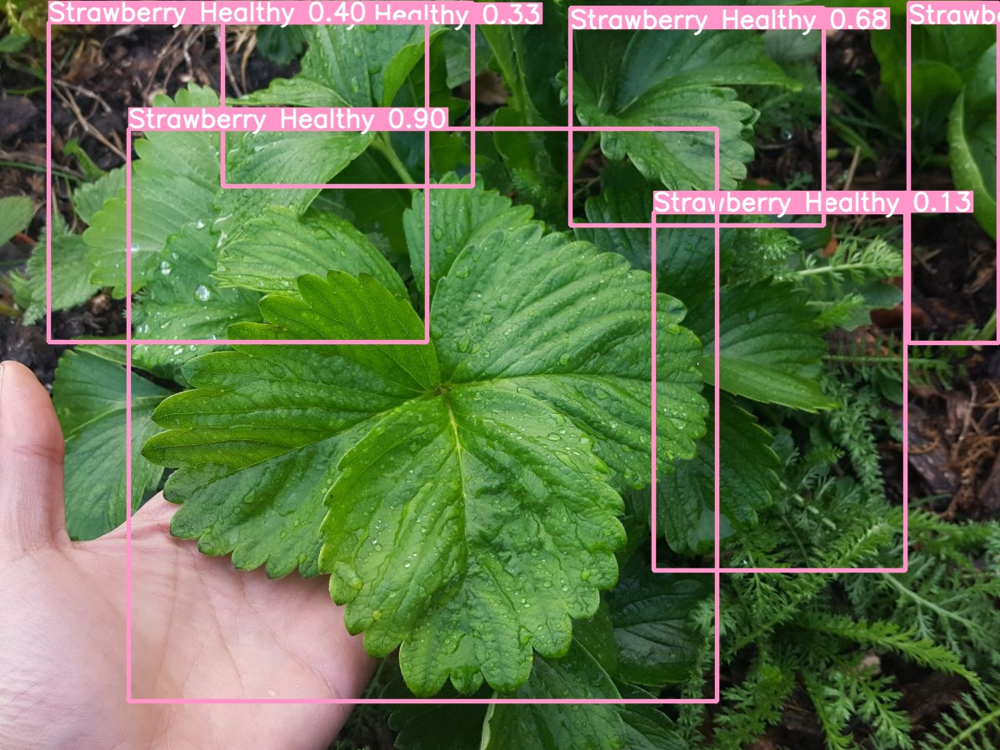

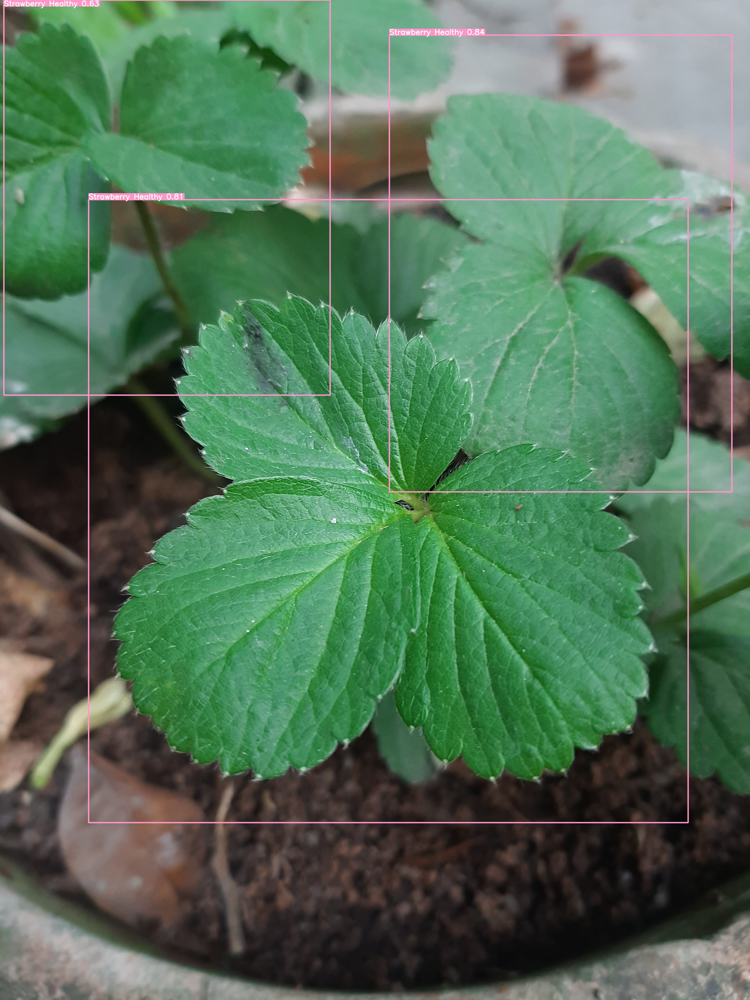

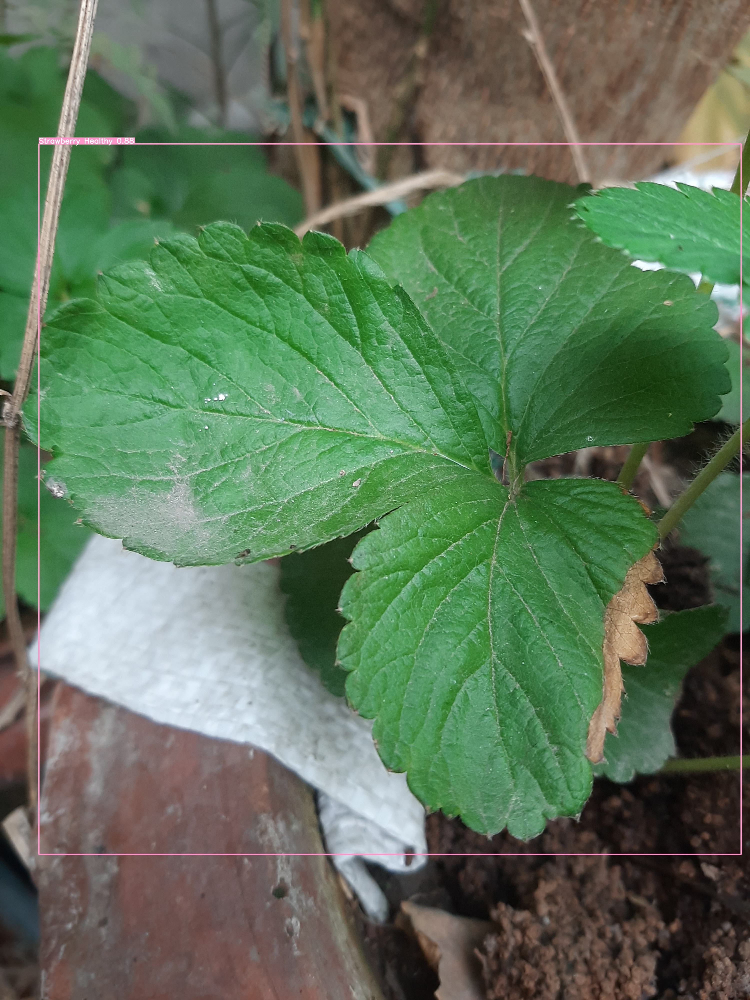

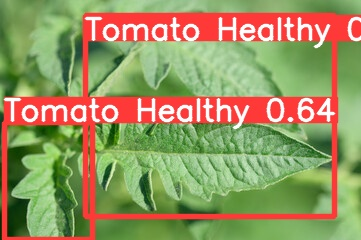

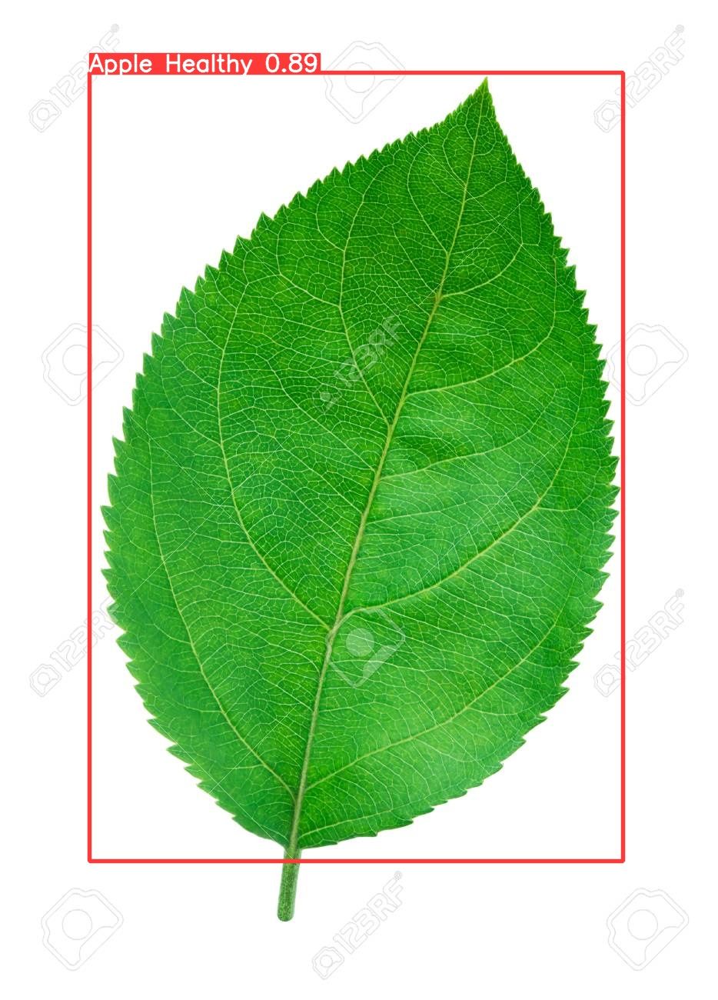

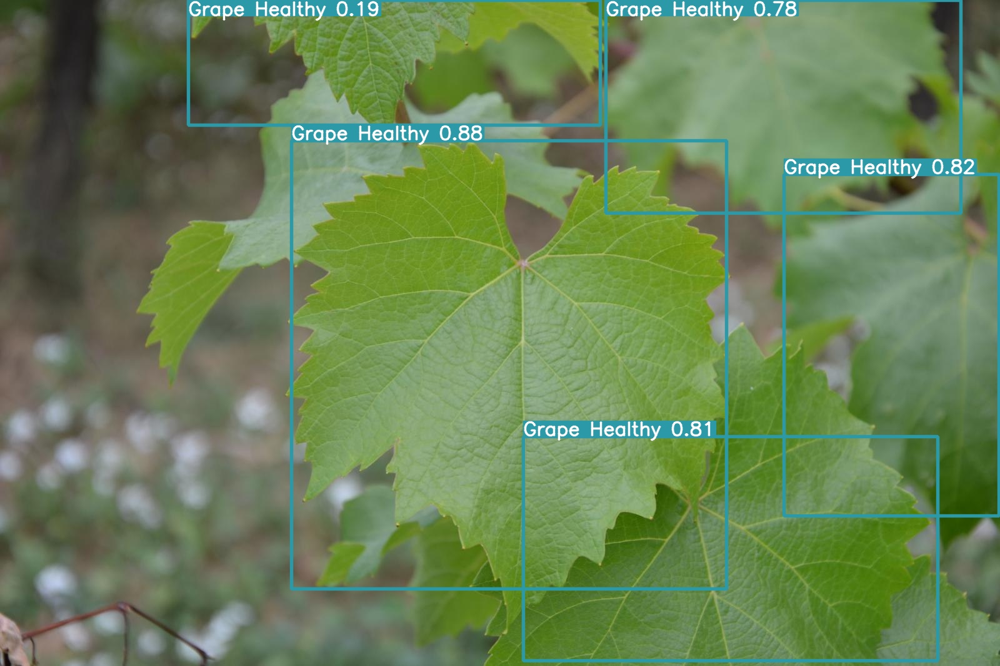

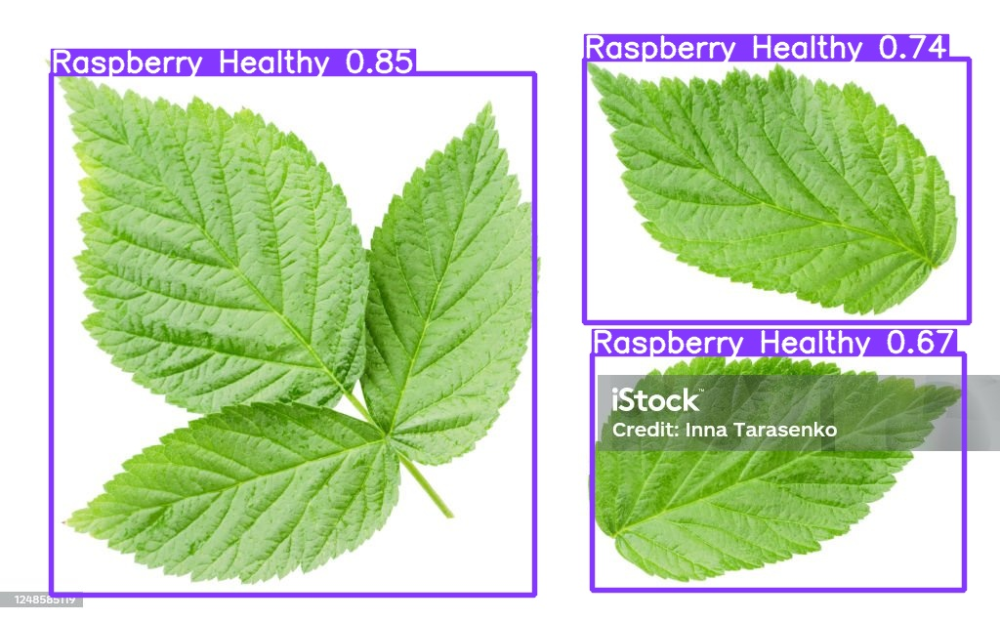

In [ ]:
import glob
from IPython.display import Image, display

for imageName in glob.glob('/content/yolov5/runs/detect/exp/*.jpg'): #assuming JPG
    display(Image(filename=imageName))
    print("\n")